In [2]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

def load_data(filename):
    """
    Funzione per il parsing di una serie intraday 
    con estensione txt esportata da Tradestation
    """
    data = pd.read_csv(filename, 
                       usecols=['Date','Time','Open','High','Low','Close','Up','Down'], 
                       parse_dates=[['Date', 'Time']], )
    data.columns = ["date_time","open","high","low","close","up","down"]
    data.set_index('date_time', inplace = True)
    data['volume'] = data['up'] + data['down']
    data.drop(['up','down'], axis=1, inplace=True)
    return data

filename = "@CL_60min_Exchange.txt"
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset[-39:-16]

,open,high,low,close,volume,hour
date_time,,,,,,
2019-11-07 12:00:00,57.23,57.80,57.16,57.71,59145,12
2019-11-07 13:00:00,57.70,57.88,57.48,57.79,43213,13
2019-11-07 14:00:00,57.79,57.82,57.43,57.60,30940,14
2019-11-07 15:00:00,57.59,57.65,56.96,57.06,50142,15
2019-11-07 16:00:00,57.07,57.07,56.82,56.92,11180,16
2019-11-07 17:00:00,56.92,57.10,56.87,57.07,4072,17
2019-11-07 19:00:00,57.08,57.13,56.96,56.96,1750,19
2019-11-07 20:00:00,56.97,57.10,56.94,56.98,2375,20
2019-11-07 21:00:00,56.98,57.00,56.83,56.95,6163,21


In [3]:
dataset.iplot(kind='candle',theme='white',
              up_color='green', down_color='red',
              title = "Copper Continuous Futures [HG]", xTitle = "Tempo", yTitle = "Prezzo")

In [4]:
dataset.tail(200).iplot(kind='candle',theme='white',
                        up_color='green', down_color='red',
                        title = "Copper Continuous Futures [HG]", xTitle = "Tempo", yTitle = "Prezzo")

Filtriamo per esempio tutti i record alle ore 0 e visualizziamo i primi 10:

In [5]:
dataset[(dataset.hour == 0)].volume.head(10)

date_time
2007-01-02    436
2007-01-03      4
2007-01-04    100
2007-01-05    457
2007-01-08    237
2007-01-09    140
2007-01-10     70
2007-01-11    315
2007-01-12    144
2007-01-15    118
Name: volume, dtype: int64

In [6]:
round(dataset[(dataset.hour == 0)].volume.mean(),2)

1476.76

In [7]:
dataset[(dataset.hour == 0)].volume.count()

3311

In [8]:
hours = []

for hour in range(0,24):
    hours.append(hour)
    
print(hours)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [9]:
activity = []

for hour in hours:
    activity.append(round(dataset[(dataset.hour == hour)].volume.mean(),2))
    
activity

[1476.76,
 1378.99,
 1791.0,
 3363.98,
 7097.05,
 8322.23,
 7288.85,
 6952.67,
 8937.52,
 17496.11,
 39826.65,
 46071.54,
 40162.33,
 24952.22,
 23654.96,
 31850.61,
 6071.38,
 2888.87,
 nan,
 1484.18,
 1085.99,
 2096.29,
 2338.21,
 1864.82]

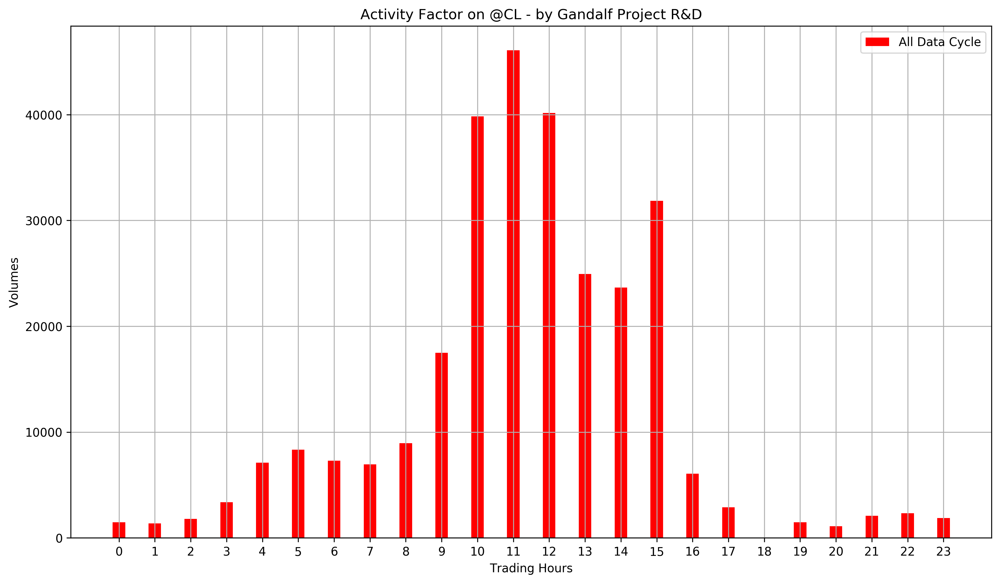

In [10]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                activity, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

In [11]:
def normalizeMinMax(array):
    """
    Funzione per normalizzare un array
    che porta a 0 il valore minimo
    e ad 1 il valore massimo
    (a[i] - min(a))/(max(a)-min(a)) 
    """
    normalized_array = []
    for elements in array:
        normalized_array.append((elements - min(array))/(max(array)-min(array)))
    return normalized_array

def normalizeMax(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a)
    """
    normalized_array = []
    for elements in array:
        normalized_array.append(elements / max(array))
    return normalized_array

normalize = True
    
if normalize == True:
    activity = normalizeMax(activity)

activity

[0.03205362790130306,
 0.029931493499023475,
 0.03887432458302891,
 0.07301644355712876,
 0.1540441235521973,
 0.180637113497834,
 0.15820721425852055,
 0.15091030167430913,
 0.19399221298007405,
 0.37975960864342717,
 0.8644523278362304,
 1.0,
 0.8717383877335119,
 0.5415972637337497,
 0.5134397504402934,
 0.6913293977149451,
 0.13178157274534344,
 0.06270400338256546,
 nan,
 0.032214681775343305,
 0.02357181895808128,
 0.045500758168708924,
 0.050751722212888914,
 0.04047661528136459]

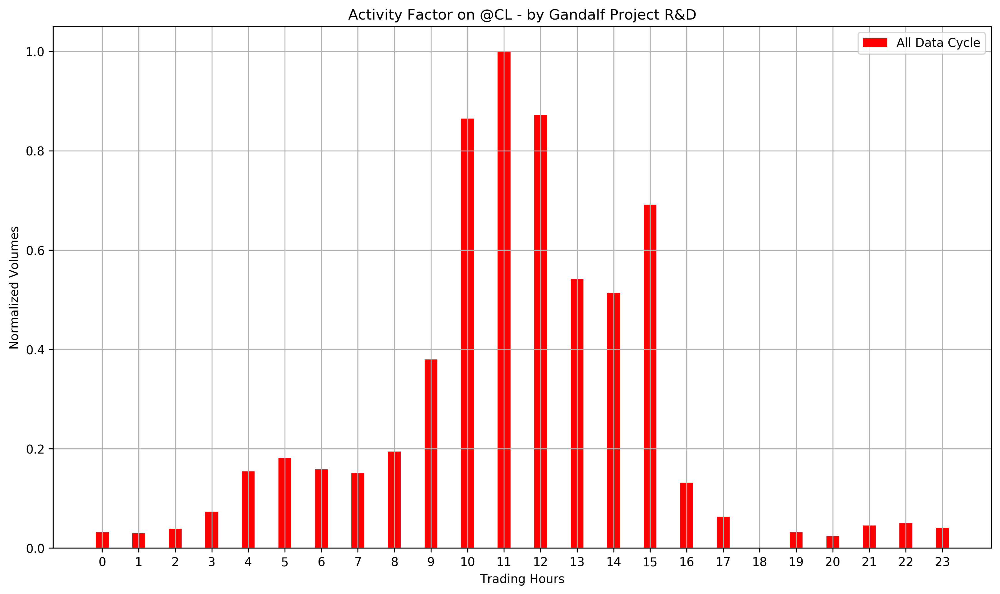

In [12]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                activity, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Volumes')
else:
    ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

### Ripetendo l'analisi su tre periodi temporali differenti:

In [13]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset.head()

,open,high,low,close,volume,hour
date_time,,,,,,
2007-01-01 19:00:00,130.84,130.91,130.70,130.70,97,19
2007-01-01 20:00:00,130.74,130.76,130.65,130.65,81,20
2007-01-01 21:00:00,130.70,130.71,130.61,130.63,74,21
2007-01-01 22:00:00,130.66,130.71,130.63,130.63,84,22
2007-01-01 23:00:00,130.66,130.66,130.45,130.46,406,23


In [14]:
dataset.index.min()

Timestamp('2007-01-01 19:00:00')

In [15]:
dataset.index.max()

Timestamp('2019-11-11 04:00:00')

In [16]:
#******* INPUT *********************************

filename = "@NG_60min_Exchange.txt"

startDateLong = "20070101"
endDateLong = "20191014"

startDateMid = "20140101"
endDateMid = "20191014"

startDateShort = "20181014"
endDateShort = "20191014"

normalize = True

#******* INPUT *********************************

In [17]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

activity_long = []
activity_mid = []
activity_short = []

hours = []
for hour in range(0,24):
    hours.append(hour)

for hour in hours:
    activity_long.append(round(instrument_Long[(instrument_Long.hour == hour)].volume.mean(),2))
    activity_mid.append(round(instrument_Mid[(instrument_Mid.hour == hour)].volume.mean(),2))
    activity_short.append(round(instrument_Short[(instrument_Short.hour == hour)].volume.mean(),2))
    
if normalize == True:
    activity_long = normalizeMax(activity_long)
    activity_mid = normalizeMax(activity_mid)
    activity_short = normalizeMax(activity_short)

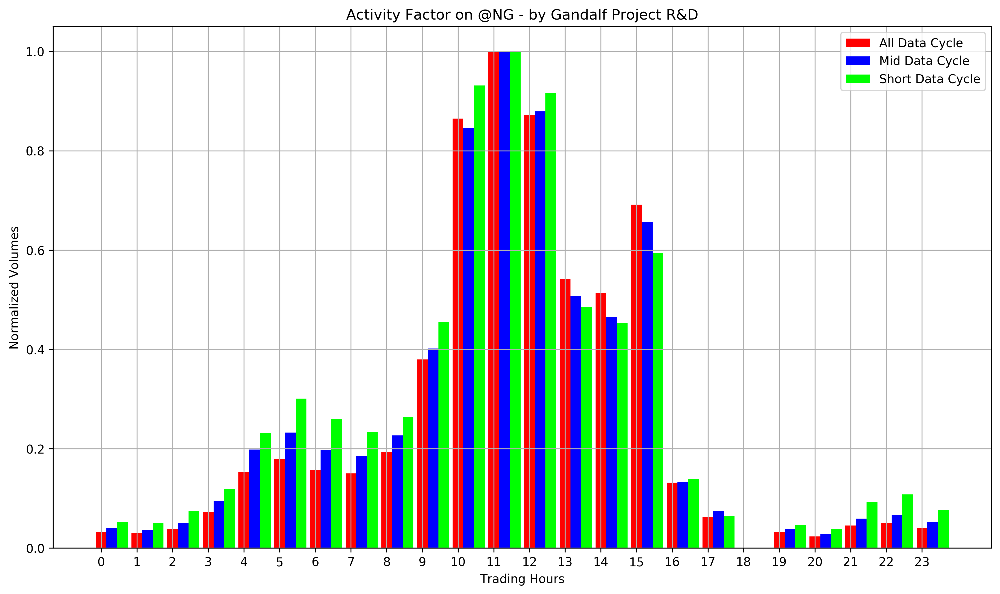

In [18]:
# MODULO GRAFICO **************************************
n_groups = 24
fig, ax = plt.subplots(figsize=(14, 8), dpi=300)
index = np.arange(n_groups)
bar_width = 0.30
opacity = 1

label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

rects1 = plt.bar(index, 
                 activity_long, 
                 bar_width,
                 alpha=opacity,
                 color='red',
                 label=label_all)
rects2 = plt.bar(index + bar_width, 
                 activity_mid, 
                 bar_width,
                 alpha=opacity,
                 color='blue',
                 label=label_mid)
rects3 = plt.bar(index + 2 * bar_width, 
                 activity_short, 
                 bar_width,
                 alpha=opacity,
                 color='lime',
                 label=label_short)

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Volumes')
else:
    ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************